In [27]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import osmnx as ox

In [28]:
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon, MultiPolygon

epsg:4326


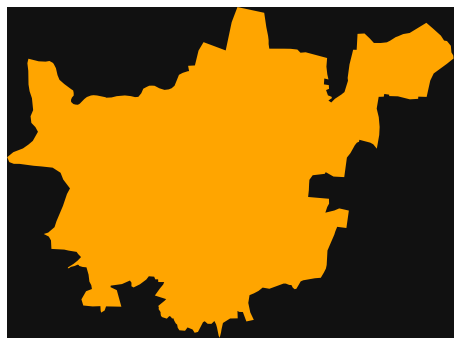

+proj=utm +zone=43 +ellps=WGS84 +datum=WGS84 +units=m +no_defs


In [29]:
city = ox.geocode_to_gdf("Pune City,Pune District,Maharashtra,India")
print(city.crs)
city = ox.project_gdf(city)
fig, ax = ox.plot.plot_footprints(city)
print(city.crs)

In [30]:
city.to_file('PuneFiles/Pune_city.shp')

In [31]:
geometry = city['geometry'].iloc[0]
print(type(geometry))

<class 'shapely.geometry.polygon.Polygon'>


In [32]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry,840)
# geometry_cut = ox.quadrat_cut_geometry(geometry, 840)  # Syntax for new version
print(type(geometry_cut))

<class 'shapely.geometry.multipolygon.MultiPolygon'>


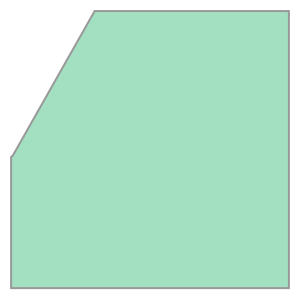

In [33]:
polylist = [p for p in geometry_cut] 
polylist[5]

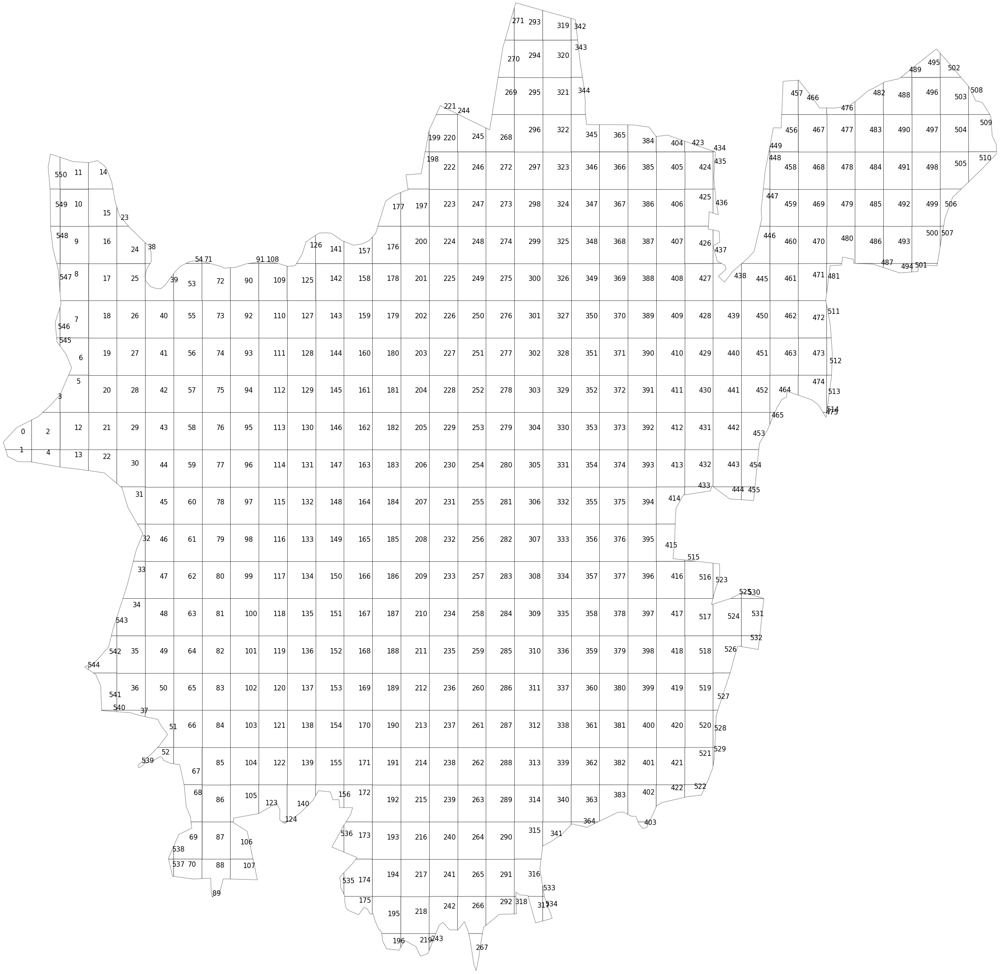

In [34]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]   #list/tuple of centre coordinates of each block 
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='left', size=15, va='bottom')
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [35]:
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=43 +ellps=WGS84 +datum=WGS84 +units=m +no_defs


,geometry
0,"POLYGON ((368050.572 2049632.112, 368442.405 2..."
1,"POLYGON ((368866.978 2049470.130, 368866.978 2..."
2,"POLYGON ((368866.978 2050117.812, 369060.169 2..."
3,"POLYGON ((369190.805 2050284.396, 369415.240 2..."
4,"POLYGON ((369683.384 2049470.130, 369683.384 2..."


In [36]:
len(polyframe)

551

/home/mrdgh2821/miniconda3/envs/edi/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


(2087882.2064219434, 2110349.938126105)

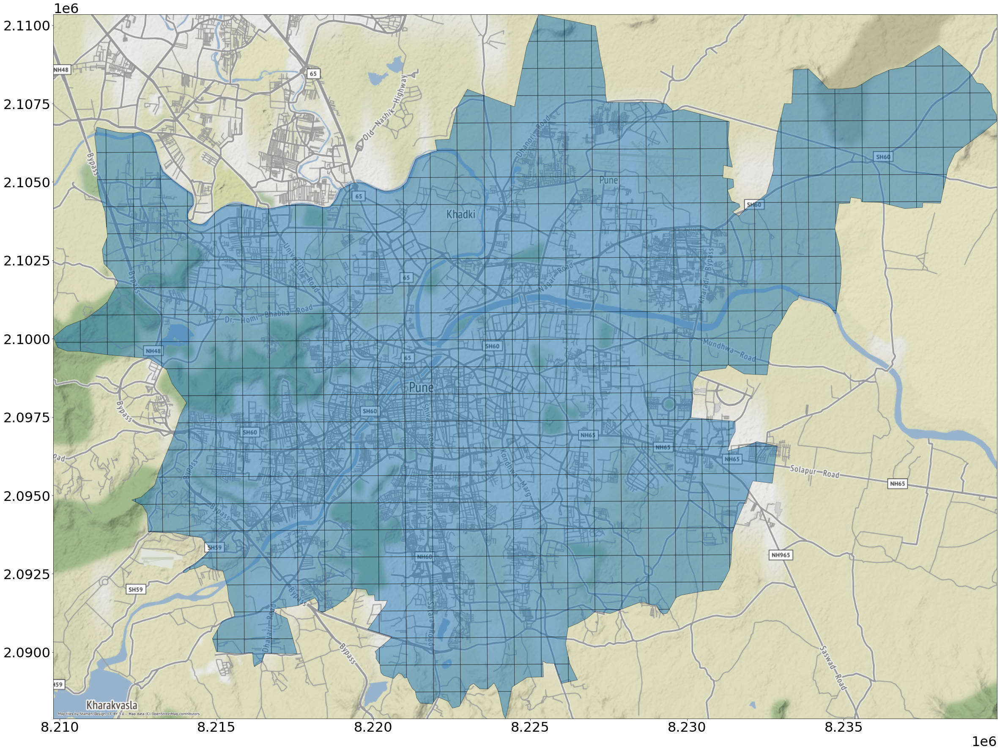

In [37]:
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

In [38]:
l = len(polylist)
OD_matrix = np.zeros(shape=(l,l))
print(OD_matrix)
print(l)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
551


In [39]:
# Population Data
from random import randint
row=randint(2,80)
opd=pd.read_csv("PunePop.csv")
pune_pop1=opd.iloc[row]
print(pune_pop1)

0      1500.000000
1      1500.000000
2      1500.000000
3      1500.000000
4      1500.000000
          ...     
544    2899.930868
545    1500.000000
546    2122.191497
547    1500.000000
548    1500.000000
Name: 17, Length: 549, dtype: float64


In [40]:
pune_pop1=pune_pop1.to_numpy()
type(pune_pop1)

numpy.ndarray

In [41]:
pune_pop1=np.append(pune_pop1,[1500,1500])

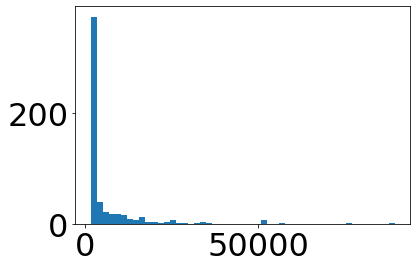

In [42]:
plt.hist(pune_pop1, bins=50)
plt.show()

In [43]:
polyframe.head()

,geometry
0,"POLYGON ((368050.572 2049632.112, 368442.405 2..."
1,"POLYGON ((368866.978 2049470.130, 368866.978 2..."
2,"POLYGON ((368866.978 2050117.812, 369060.169 2..."
3,"POLYGON ((369190.805 2050284.396, 369415.240 2..."
4,"POLYGON ((369683.384 2049470.130, 369683.384 2..."


In [44]:
print('Pune Geodataframe Length: ', len(polyframe))
print('Pune Population Array Length: ', len(pune_pop1))

Pune Geodataframe Length:  551
Pune Population Array Length:  551


In [45]:
type(pune_pop1)

numpy.ndarray

In [46]:
polyframe['population'] = pune_pop1
polyframe.head()

,geometry,population
0,"POLYGON ((368050.572 2049632.112, 368442.405 2...",1500.0
1,"POLYGON ((368866.978 2049470.130, 368866.978 2...",1500.0
2,"POLYGON ((368866.978 2050117.812, 369060.169 2...",1500.0
3,"POLYGON ((369190.805 2050284.396, 369415.240 2...",1500.0
4,"POLYGON ((369683.384 2049470.130, 369683.384 2...",1500.0


<ipython-input-47-60248eb41946>:11: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=n, xy=p, horizontalalignment='center', size=15)


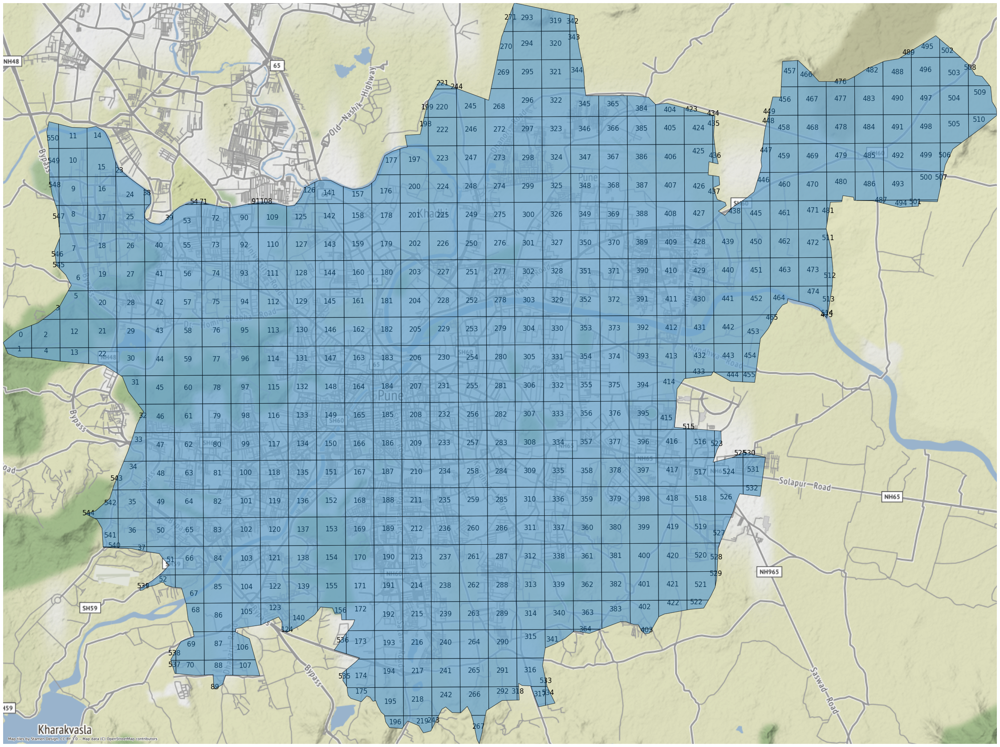

In [47]:
polylist = [p for p in polyframe_3857.geometry]
# 3720
# plot city
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k', zorder=5)
for polygon, n in zip(polylist, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p, horizontalalignment='center', size=15)
ctx.add_basemap(ax, zoom=13)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

/home/mrdgh2821/miniconda3/envs/edi/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


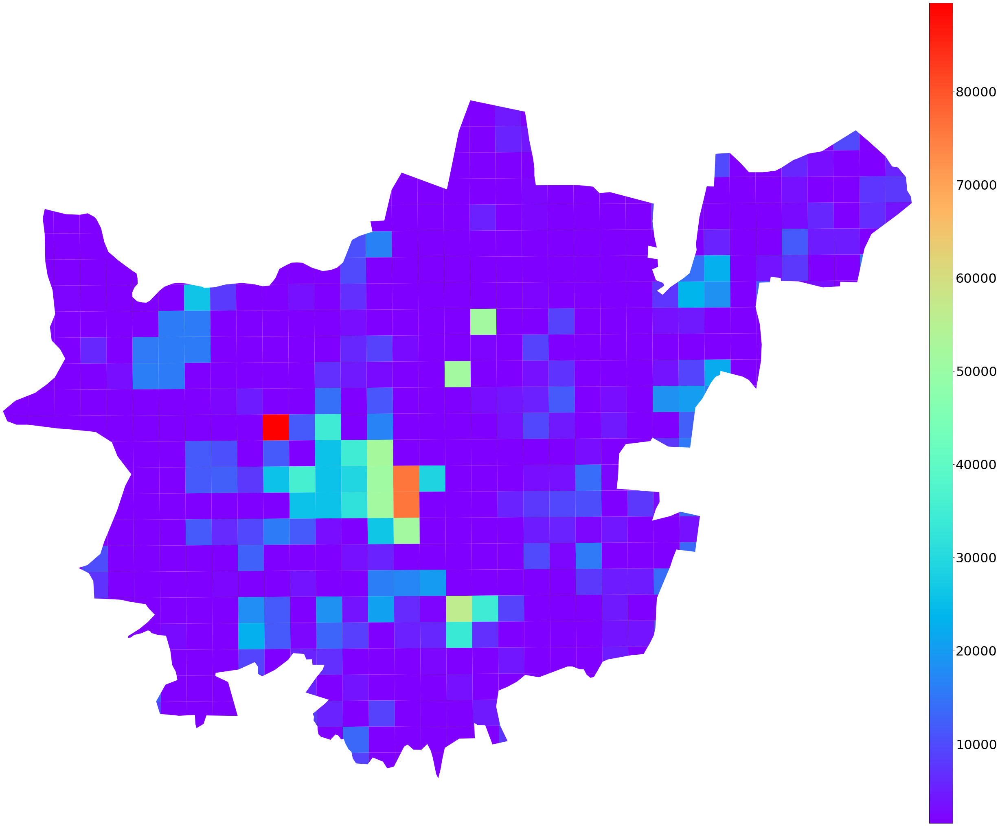

In [48]:
plt.rcParams.update({'font.size':32})
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap='rainbow')

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='rainbow', \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()